In [10]:
import os
import cv2

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.cluster import DBSCAN
from sklearn.linear_model import RANSACRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

import plotly.express as px
import plotly.graph_objects as go

from IPython.display import Video

- intesidad: no interesa
- t: marca de tiempo (no interesa)
- reflectividad (no interesa)
- ring: plano
- ambient: luz ambiental (no interasa)
- range: rango maximo con esa potencia

In [2]:
df = pd.read_csv('./data/carretera.csv')
df.tail(10)

,x,y,z,intensity,t,reflectivity,ring,ambient,range
131062,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131063,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131064,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131065,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131066,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131067,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131068,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131069,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131070,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0
131071,-0.0,-0.0,-0.0,0.0,586440720,0,127,0,0


In [3]:
fig = px.scatter(df, x='x', y='z', color='ring')
fig.show()

In [4]:
print(f"Number of rows before removing: {len(df)}")
def filter_points(df_input):
    widht = 4
    lenght = 25

    df_filtered = df_input[~((df_input['x'] == 0) & (df_input['y'] == 0) & (df_input['z'] == 0))]
    df_filtered = df_filtered[(df_filtered['z'] > -widht) & (df_filtered['z'] < widht) & (df_filtered['x'] > -lenght) & (df_filtered['x'] < lenght)]
    df_filtered = df_filtered[df_filtered['y'] > 2]
    return df_filtered

df_cleaned = filter_points(df)
print(f"Number of rows after removing: {len(df_cleaned)}")
fig = px.scatter(df_cleaned, x='x', y='z', color='y')
fig.show()

Number of rows before removing: 131072
Number of rows after removing: 32422


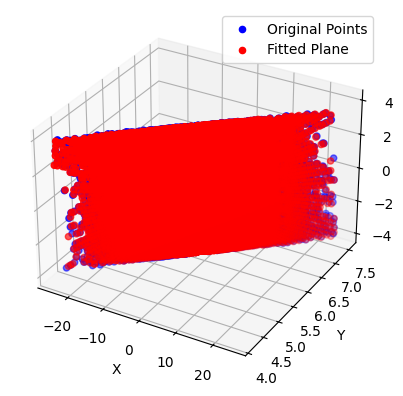

In [5]:
# Extracting the relevant columns
X = df_cleaned[['x', 'z']]
y = df_cleaned['y']

# Creating a polynomial feature transformer and RANSAC regressor
ransac = make_pipeline(PolynomialFeatures(degree=1), RANSACRegressor())

# Fitting the model
ransac.fit(X, y)

# Predicting the plane
y_pred = ransac.predict(X)

# Plotting the original points and the fitted plane
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_cleaned['x'], df_cleaned['y'], df_cleaned['z'], color='blue', label='Original Points')
ax.scatter(df_cleaned['x'], y_pred, df_cleaned['z'], color='red', label='Fitted Plane')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.legend()
plt.show()

In [6]:
# Definir el directorio donde se encuentran los archivos CSV
directory = './data/pointclouds/'

# Function to extract the numerical part of the filenames
def extract_timestamp(filename):
    # Remove 'pointcloud_' and '.csv' to keep only the numbers
    return int(filename.replace('pointcloud_', '').replace('.csv', '').replace('_', ''))

dataframes = []

# Sort the files based on the extracted numbers
for filename in sorted(os.listdir(directory), key=extract_timestamp):
    if filename.endswith('.csv'):  # Check if the file is a CSV
        file_path = os.path.join(directory, filename)  # Create the full file path
        df = pd.read_csv(file_path)  # Load the CSV into a DataFrame
        dataframes.append(df)  # Append the DataFrame to the list

In [7]:
len(dataframes)

369

In [8]:
i = 0
for frame in dataframes:
    i = i+1
    X = frame[['x', 'y', 'z']]

    dbscan = DBSCAN(eps=2, min_samples=10)

    y_dbscan = dbscan.fit_predict(X)

    df_clustered = X.copy()
    df_clustered['cluster'] = y_dbscan

    # Delete noise
    df_clustered = df_clustered[df_clustered['cluster'] != -1]

    # print(np.unique(y_dbscan))

    fig = px.scatter(df_clustered, x='x', y='y', color='cluster')

    df_result = pd.DataFrame()
    df_result['x'] = df_clustered['x']
    df_result['y'] = df_clustered['y']
    df_result['z'] = df_clustered['z']
    df_result['cluster'] = df_clustered['cluster']

    # Calculate bounding boxes for each cluster
    bounding_boxes = {}

    for cluster in np.unique(y_dbscan)[1:]:
        cluster_points = df_result[df_result['cluster'] == cluster]
        min_x, max_x = cluster_points['x'].min(), cluster_points['x'].max()
        min_y, max_y = cluster_points['y'].min(), cluster_points['y'].max()
        min_z, max_z = cluster_points['z'].min(), cluster_points['z'].max()
        bounding_boxes[cluster] = {
            'min_x': min_x, 'max_x': max_x,
            'min_y': min_y, 'max_y': max_y,
            'min_z': min_z, 'max_z': max_z
        }

    fig = go.Figure()

    # Add original data points
    fig.add_trace(go.Scatter3d(
        x=df_result['x'],
        y=df_result['y'],
        z=df_result['z'],
        mode='markers',
        marker=dict(
            size=3,  # Increase marker size
            color=df_result['cluster'],
            colorscale='Viridis',
            opacity=0.8
        ),
        name='Data Points'  # Add a name for the legend
    ))

    # Add bounding boxes
    for cluster, bbox in bounding_boxes.items():
        fig.add_trace(go.Scatter3d(
            x=[bbox['min_x'], bbox['max_x'], bbox['max_x'], bbox['min_x'], bbox['min_x'], bbox['min_x'], bbox['max_x'], bbox['max_x'], bbox['min_x'], bbox['min_x'], bbox['max_x'], bbox['max_x'], bbox['max_x'], bbox['max_x'], bbox['min_x'], bbox['min_x'], bbox['min_x']],
            y=[bbox['min_y'], bbox['min_y'], bbox['max_y'], bbox['max_y'], bbox['min_y'], bbox['min_y'], bbox['min_y'], bbox['max_y'], bbox['max_y'], bbox['max_y'], bbox['max_y'], bbox['max_y'], bbox['min_y'], bbox['min_y'], bbox['min_y'], bbox['min_y'], bbox['max_y']],
            z=[bbox['min_z'], bbox['min_z'], bbox['min_z'], bbox['min_z'], bbox['min_z'], bbox['max_z'], bbox['max_z'], bbox['max_z'], bbox['max_z'], bbox['min_z'], bbox['min_z'], bbox['max_z'], bbox['max_z'], bbox['min_z'], bbox['min_z'], bbox['max_z'], bbox['max_z']],
            mode='lines',
            line=dict(color='red', width=3),  # Increase line width
            name=f'Vehiculo {cluster}'  # Improved naming
        ))

    # Update layout
    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
            aspectmode='data',
            camera=dict(
                eye=dict(x=5, y=3, z=4)  # Adjust camera angle
            )
        ),
        title='Carretera',
        legend=dict(title='Legend')  # Improve legend title
    )

    fig.write_image(f"./frames/frame_{i}.png")

In [14]:
# Path to the folder containing the images
image_folder = './frames/'  
video_name = 'video.mp4'  # Output video name

# Get all images from the folder
images = [img for img in os.listdir(image_folder) if img.endswith(".jpg") or img.endswith(".png")]
images.sort()  # Sort the images if necessary

# Read the first image to get dimensions
first_image = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = first_image.shape

# Define the codec and create the VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec compatible with macOS
video = cv2.VideoWriter(video_name, fourcc, 5, (width, height))  # 30 FPS

# Add each image to the video
for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

# Release the VideoWriter object
video.release()
cv2.destroyAllWindows()

print("Video created successfully.")

Video created successfully.
